In [2]:
import numpy as np
import pandas as pd
# from keras.models import Sequential
# from keras.layers import LSTM
# from keras.layers import Dense
from collections import defaultdict

In [2]:
# timeseries with LSTM
# https://machinelearningmastery.com/how-to-develop-lstm-models-for-time-series-forecasting/
# pad timeseries, make sure all input have the same lrngth (N,  T, D) 

# univariate timeseries : (N, T, 1)

# multi-variate timeseries : (N, T, num_features)

# convenience of LSTM: we don't have to use several models when predicting multiple days

In [3]:
data = pd.read_csv('./preprocessed_data.csv')

In [18]:
# look at each data, Store, Dept unique
from collections import Counter
dates = data.groupby([data.Store, data.Dept]).Date.count().reset_index()
Counter(dates.Date.values) # T:143

Counter({143: 2660,
         113: 6,
         71: 6,
         22: 6,
         125: 9,
         33: 7,
         133: 7,
         3: 19,
         4: 18,
         122: 7,
         37: 4,
         66: 3,
         139: 11,
         12: 12,
         136: 8,
         111: 3,
         2: 30,
         10: 12,
         42: 3,
         115: 6,
         8: 12,
         54: 4,
         61: 1,
         123: 5,
         1: 37,
         21: 4,
         140: 11,
         36: 6,
         124: 2,
         49: 2,
         13: 10,
         141: 15,
         23: 6,
         7: 8,
         100: 6,
         57: 7,
         69: 6,
         11: 8,
         56: 2,
         5: 14,
         98: 1,
         119: 5,
         103: 1,
         74: 2,
         127: 6,
         67: 2,
         18: 9,
         91: 5,
         9: 13,
         40: 4,
         95: 1,
         52: 2,
         85: 5,
         16: 6,
         83: 3,
         76: 2,
         39: 1,
         117: 4,
         135: 6,
         116: 2,
         14:

In [ ]:
# for each store, we train one univariate LSTM model, N: number of stores
# pad or truncate each sequence to 143 length


In [5]:
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return X,y


In [6]:
# choose a number of time steps

X_train, Y_train, X_test,  Y_test = {},{},{},{}
n_steps = 7
for s in data.Store.unique():
    X1,Y1, X2, Y2 = [], [], [], []
    for d in data.Dept.unique():
        sample = data.loc[(data.Store==s)&(data.Dept==d)]
        if len(sample) > n_steps:
            sample_y = list(sample.y.values)
        else:
            continue
        
        # for each store and each dept, we have the split sample res
        x, y = split_sequence(sample_y, n_steps)

        X1 += x[:-1]
        Y1 += y[:-1]
        X2 += [x[-1]]
        Y2 += [y[-1]]
    X_train[s] = np.array(X1)
    Y_train[s] = np.array(Y1)
    X_test[s] = np.array(X2)
    Y_test[s] = np.array(Y2)

In [7]:
from collections import defaultdict

In [13]:
def mae_scale(y, yhat, naive):
    return np.abs(y - yhat)/ np.abs(y - naive)

def mape(pred, actual):
#     return np.mean(abs((actual - pred) / actual))
    return np.sum(abs(actual-pred)) / np.sum(actual)

In [16]:
n_features = 1
n_steps = 7
res = defaultdict(dict)
mape_accuracy = defaultdict(dict)
mae_accuracy = defaultdict(dict)
for s in data.Store.unique():
    x_train, y_train, x_test, y_test = X_train[s], Y_train[s], X_test[s],  Y_test[s]
    N = len(x_train)
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    x_train_r = x_train.reshape(N, n_steps, n_features)
    x_test_r = x_test.reshape(len(x_test), n_steps, n_features)
    model.fit(x_train_r, y_train, epochs=200, verbose=0)
    yhat = model.predict(x_test_r, verbose=0) # prediction for each dept
    yhat = yhat.reshape(len(y_hat),)

    depts = data.loc[(data.Store==s)]
    c = 0
    for d in depts.Dept.unique():
        if len(depts.loc[depts.Dept == d]) > n_steps:
            mape_res = mape(yhat[c], y_test[c])
            naive = x_test[c][-1]
            mae = mae_scale(y_test[c], yhat[c], naive)
            mape_accuracy[s][d] = mape_res
            mae_accuracy[s][d] = mae
            res[s][d] = yhat
            print('Store: '+ str(s) + ' Dept: ' + str(d) + ' mape: '+ str(mape) + ' mae_scaled_error: '+ str(mae))
        c+=1

W0710 12:56:19.193289 140734794479040 deprecation_wrapper.py:119] From /Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0710 12:56:19.210185 140734794479040 deprecation_wrapper.py:119] From /Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0710 12:56:19.212707 140734794479040 deprecation_wrapper.py:119] From /Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0710 12:56:19.433123 140734794479040 deprecation_wrapper.py:119] From /Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/optimizers.p

KeyboardInterrupt: 

In [31]:
logging.basicConfig(filename="./lstm_log.log", filemode='w', level=logging.INFO)
console = logging.StreamHandler()  
console.setLevel(logging.ERROR)  
logging.getLogger("").addHandler(console)
logging.info('your text goes here')

In [18]:
import logging

In [6]:
# how to decide if LSTM is trained on per store level or per dept level or group together
import matplotlib.pyplot as plt

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


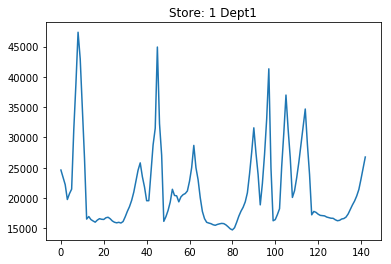

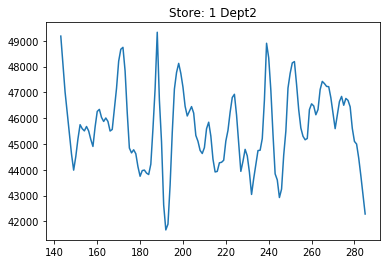

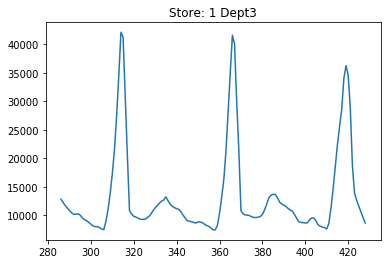

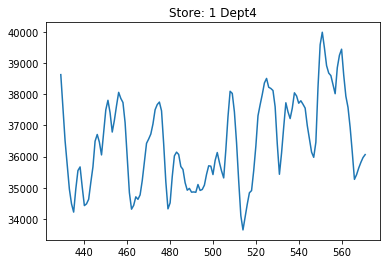

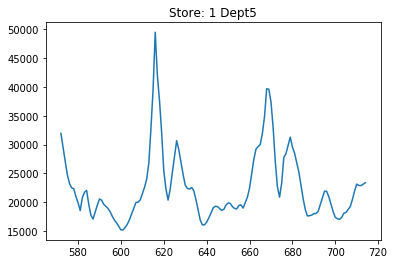

...

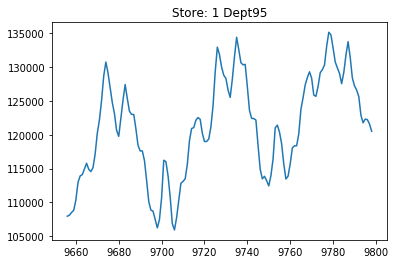

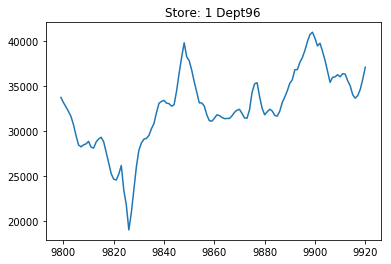

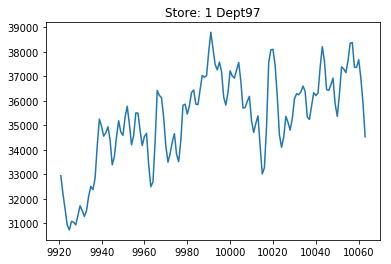

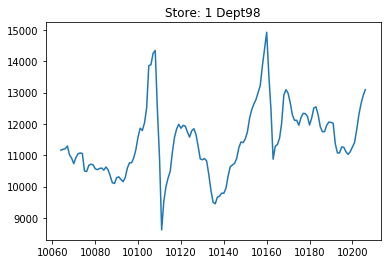

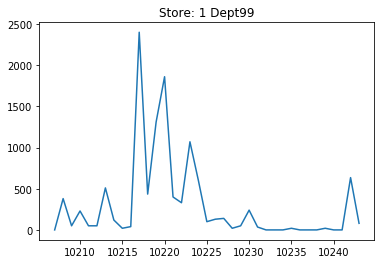

In [41]:
d = data.loc[data.Store==1]
c= 0
for dept in d.Dept.unique():
    plt.figure(c)
    plt.plot(d.loc[d.Dept==dept].y)
    plt.title('Store: 1' + ' Dept' + str(dept))
    c+=1

In [42]:
data.Store.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45])

In [4]:
mae = np.load('./np/uni_lstm_mae.npy').item()

In [34]:
res = np.load('./np/uni_lstm_res.npy').item()

In [35]:
res

defaultdict(dict,
            {1: {1: array([2.4573807e+04, 4.3378516e+04, 1.0668952e+04, 3.6110910e+04,
                     2.2956297e+04, 3.7695818e+03, 2.1403982e+04, 3.8463863e+04,
                     3.9000027e+04, 2.7737383e+04, 2.1329785e+04, 9.4242568e+03,
                     3.8554434e+04, 1.1823580e+04, 1.0661165e+04, 7.8896792e+03,
                     8.3216133e+03, 1.4324622e+03, 3.2507229e+03, 7.7436211e+03,
                     8.3500840e+03, 2.0256725e+04, 7.3011084e+03, 1.0526759e+04,
                     7.0212319e+03, 1.6732041e+03, 6.5797382e+02, 3.8639473e+03,
                     2.5990889e+03, 1.3919486e+03, 5.8341592e+03, 5.6442505e+03,
                     1.0174319e+04, 1.6564252e+03, 8.4926672e+02, 2.5035100e+03,
                     7.1965016e+04, 5.7548535e+04, 1.2784220e+03, 7.2412427e+03,
                     6.2444712e+03, 3.2189537e+01, 1.7262539e+04, 5.3526569e+01,
                     2.6175251e+03, 1.0069350e+04, 3.1416101e+01, 2.2015891e+03,
    

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


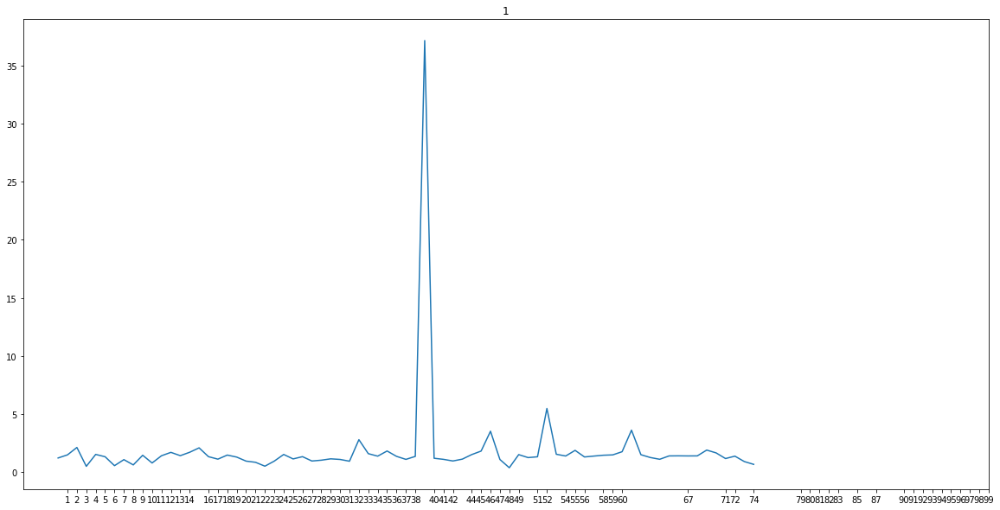

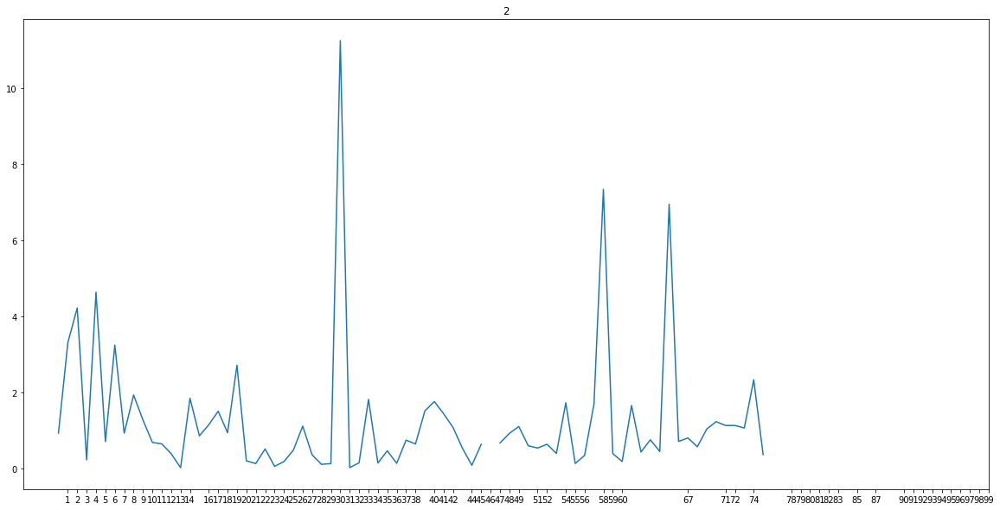

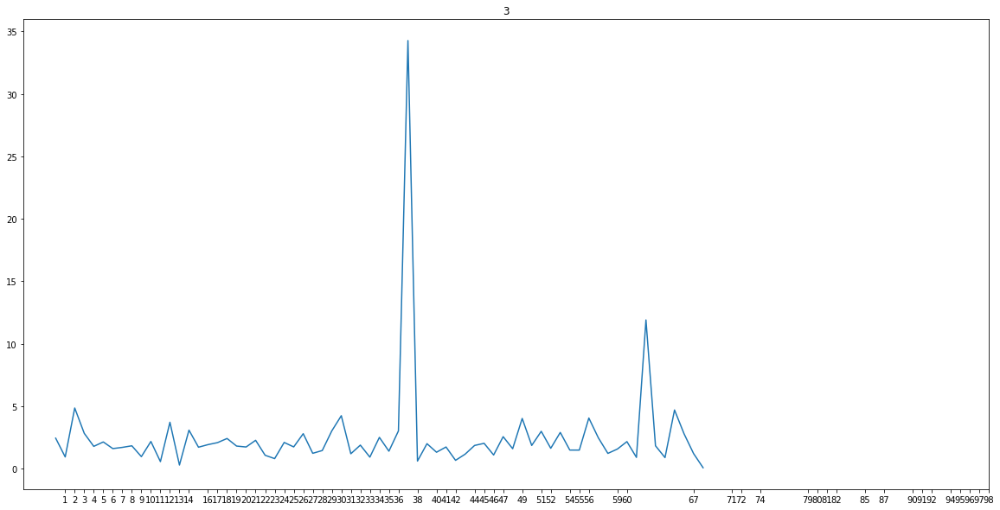

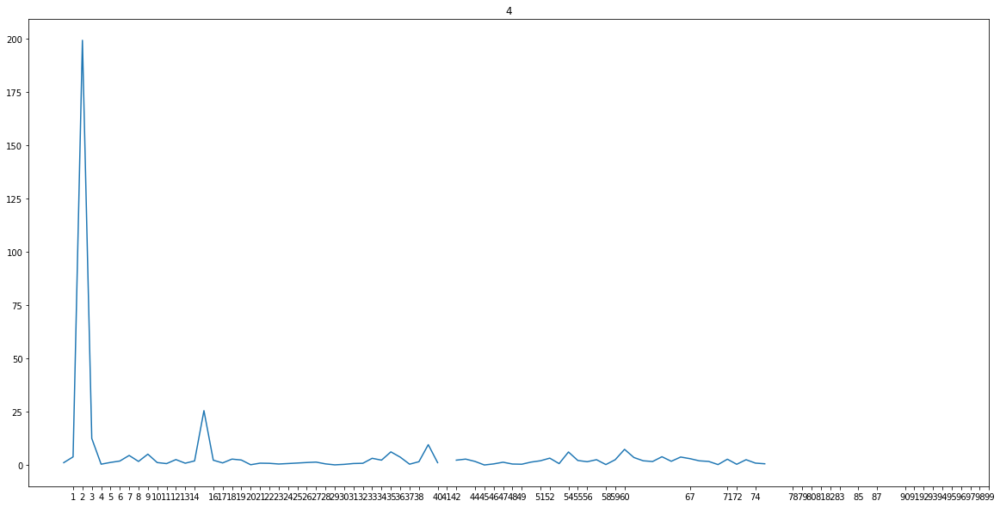

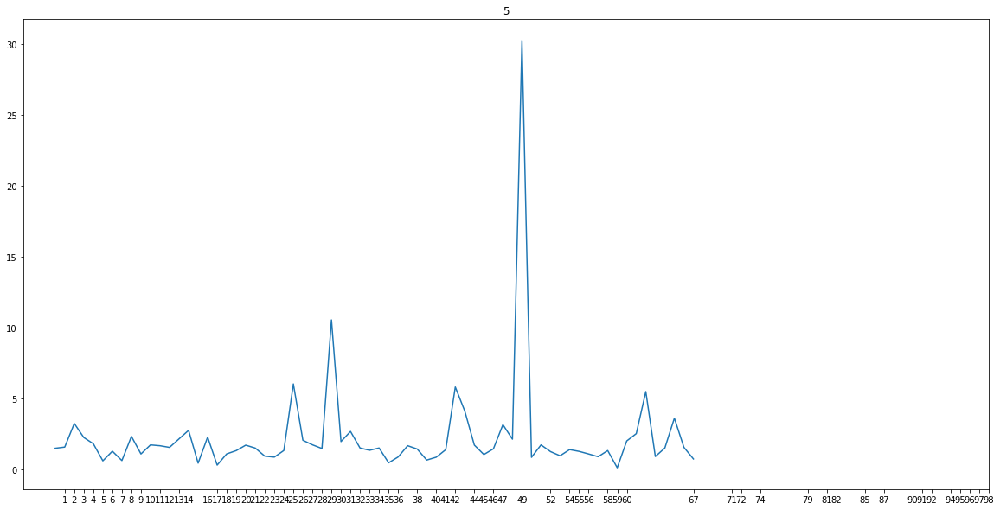

...

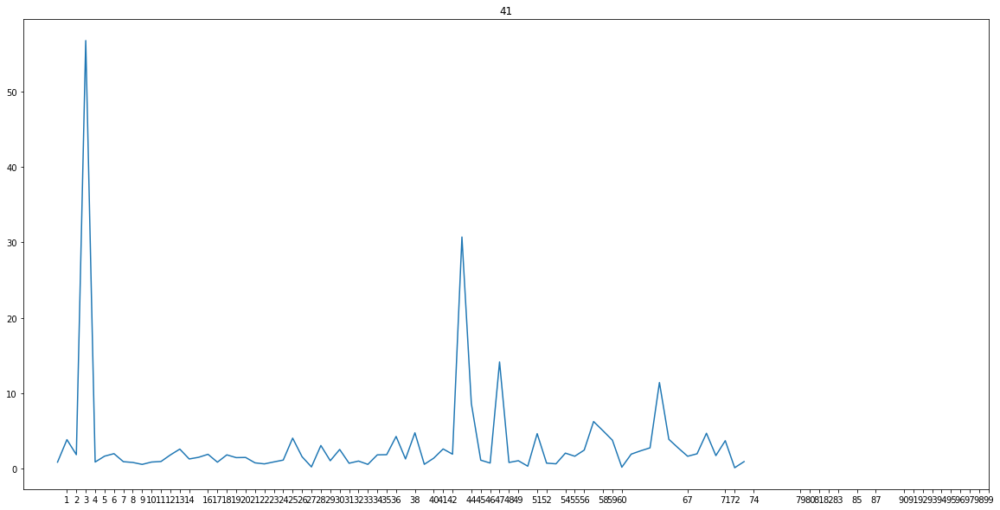

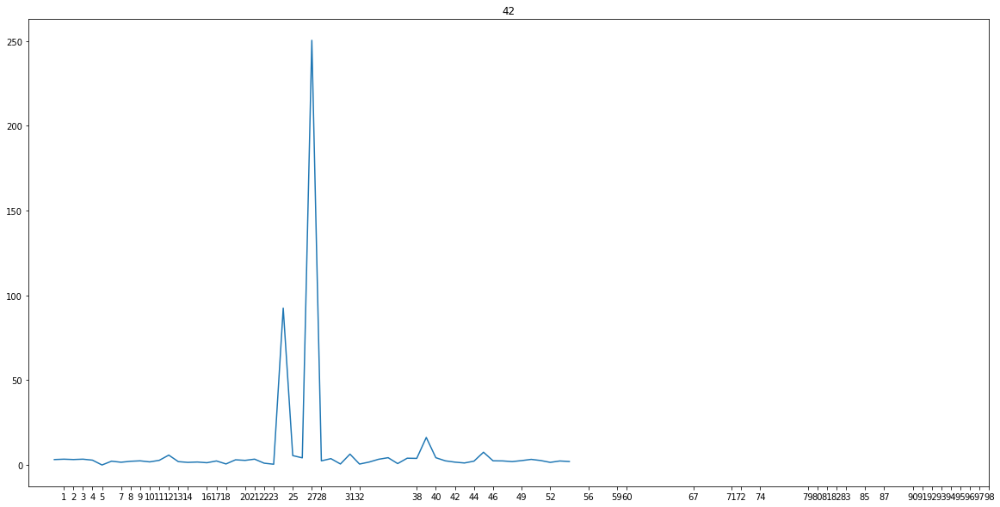

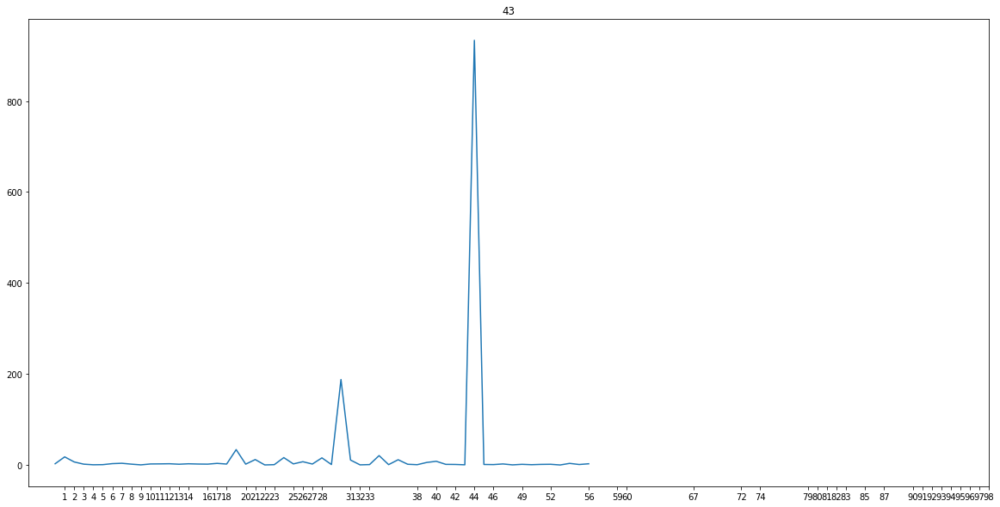

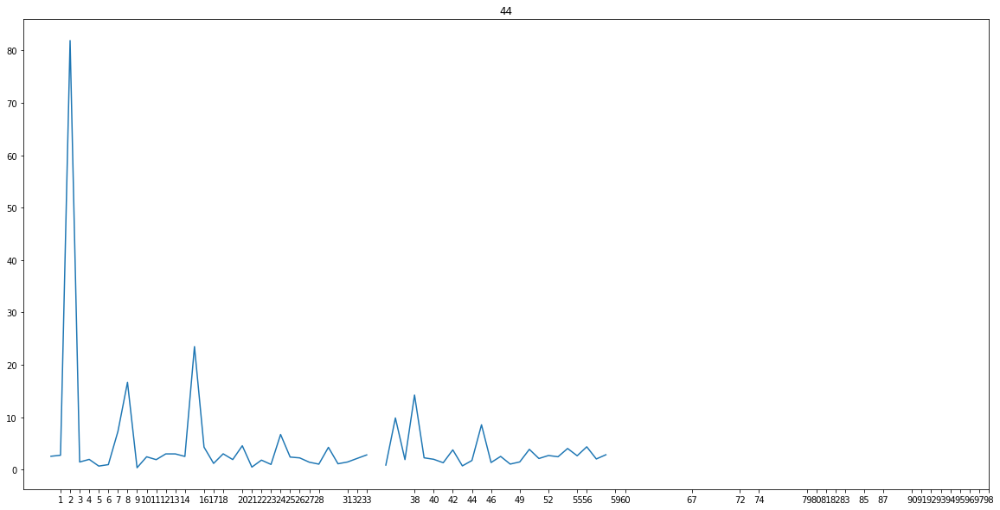

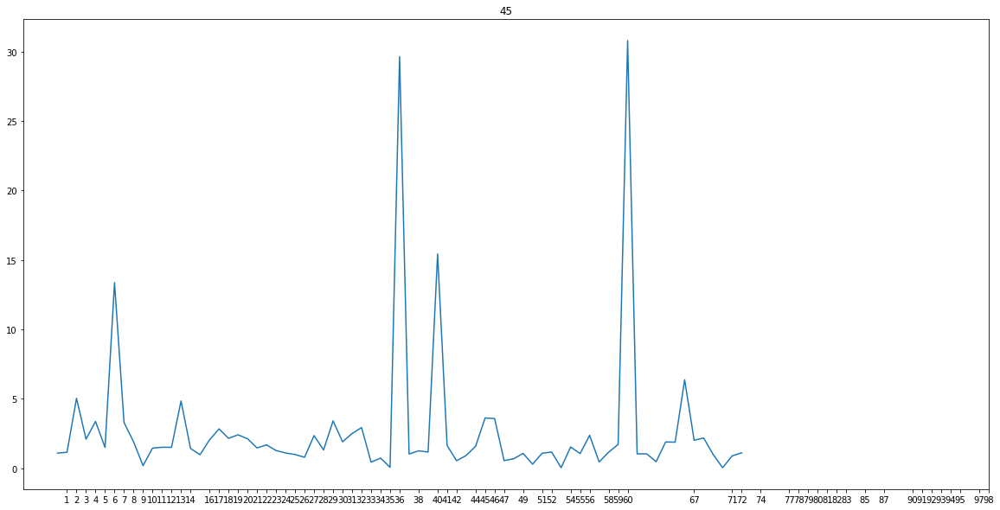

In [57]:

for store in mae.keys():
    plt.figure(figsize=(20,10))
    plt.plot(list(mae[store].values()))
    plt.xticks(list(mae[store].keys()))
    plt.title(str(store))

In [9]:
# check mean, max, std for each store
store_mae = defaultdict(dict)
count_qualified_rate = {}
for store in mae.keys():
    dep_performance = list(mae[store].values())
    count = len([i for i in dep_performance if i<1])
    count_qualified_rate[store] = count/len(dep_performance)
    store_mae['mean'][store] = np.mean(dep_performance)
    store_mae['min'][store] = np.min(dep_performance)
    store_mae['max'][store] = np.max(dep_performance)
    store_mae['std'][store] = np.std(dep_performance)
    
    

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/_methods.py:112: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


In [10]:
store_mae['mean']

{1: 1.8730681669103775,
 2: inf,
 3: 2.580576340239468,
 4: inf,
 5: 2.273360884684448,
 6: inf,
 7: 1.190828102003934,
 8: 65.97740395950115,
 9: inf,
 10: 219887680971.34747,
 11: 8127942091808.679,
 12: inf,
 13: 2.4465173642919735,
 14: 4.6943271315360535,
 15: inf,
 16: 652490874492.9045,
 17: 3.1615217513108496,
 18: inf,
 19: inf,
 20: 2.231679859758321,
 21: 7.9043011155326255,
 22: inf,
 23: 1.3552307207060965,
 24: inf,
 25: inf,
 26: 3.6180536910348806,
 27: inf,
 28: 5.02231967740978,
 29: 2.743263916690242,
 30: inf,
 31: 4.520303535154297,
 32: 7218174183496.465,
 33: inf,
 34: inf,
 35: 12.072805425168626,
 36: inf,
 37: inf,
 38: inf,
 39: 2.5229846732674397,
 40: 15.94589235281687,
 41: 3.3718033085557435,
 42: 9.038287985683606,
 43: 23.768671395236353,
 44: inf,
 45: 2.794740928791124}

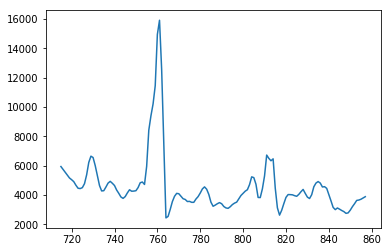

In [20]:
plt.plot(data.loc[(data.Store==1)&(data.Dept==6)].y)

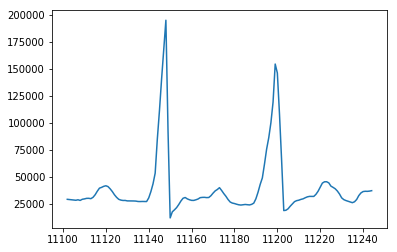

In [22]:
plt.plot(data.loc[(data.Store==2)&(data.Dept==7)].y)

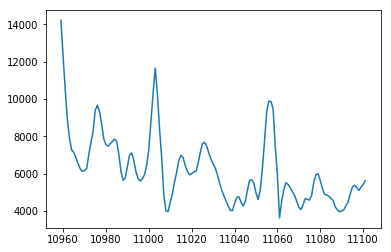

In [21]:
plt.plot(data.loc[(data.Store==2)&(data.Dept==6)].y)

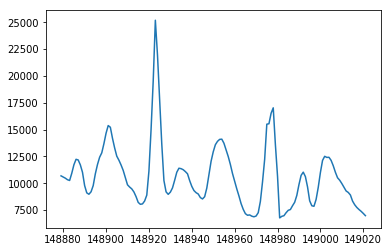

In [23]:
plt.plot(data.loc[(data.Store==16)&(data.Dept==7)].y)

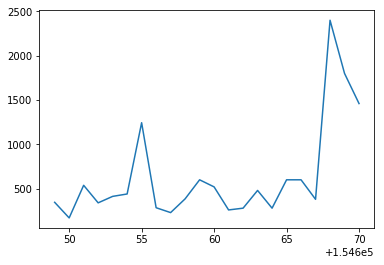

In [33]:
plt.plot(data.loc[(data.Store==16)&(data.Dept==58)].y)

In [38]:
res[16][59][58]

606.1212

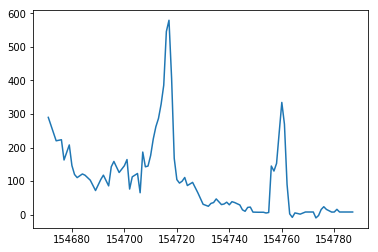

In [32]:
plt.plot(data.loc[(data.Store==16)&(data.Dept==59)].y)

In [27]:
y_sum = data.loc[data.Store==16].y.groupby(data.Dept).sum().reset_index()

In [ ]:
# need to normalize in LSTM training


In [39]:
data.loc[data.y<0]

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,CPI,Unemployment,Type,Size,y,promotion,Month,Year,day,dayofweek
2384,1,18,2012-05-04,-1.27,0,75.55,3.749,21290.13,0.00,69.89,...,221.671800,7.143,A,151315,-1.270000,0,5,2012,4,4
6048,1,47,2010-02-19,-863.00,0,39.93,2.514,0.00,0.00,0.00,...,211.289143,8.106,A,151315,-863.000000,0,2,2010,19,4
6049,1,47,2010-03-12,-698.00,0,57.79,2.667,0.00,0.00,0.00,...,211.380643,8.106,A,151315,-698.000000,0,3,2010,12,4
6051,1,47,2010-10-08,-58.00,0,63.93,2.633,0.00,0.00,0.00,...,211.746754,7.838,A,151315,-58.000000,0,10,2010,8,4
6056,1,47,2011-04-08,-298.00,0,67.84,3.622,0.00,0.00,0.00,...,215.074394,7.682,A,151315,-298.000000,0,4,2011,8,4
6057,1,47,2011-07-08,-198.00,0,85.83,3.480,0.00,0.00,0.00,...,215.277175,7.962,A,151315,-198.000000,0,7,2011,8,4
6061,1,47,2011-10-14,-498.00,0,71.74,3.274,0.00,0.00,0.00,...,217.355273,7.866,A,151315,-498.000000,0,10,2011,14,4
6062,1,47,2011-12-23,-498.00,0,47.96,3.112,2725.36,40.48,634.70,...,219.357722,7.866,A,151315,-498.000000,0,12,2011,23,4
6063,1,47,2012-02-17,-198.00,0,45.32,3.510,9873.33,11062.27,9.80,...,220.425759,7.348,A,151315,-198.000000,0,2,2012,17,4
6064,1,47,2012-03-16,-199.00,0,64.74,3.734,4298.16,7.50,2.02,...,221.211813,7.348,A,151315,-199.000000,0,3,2012,16,4


In [31]:
y_sum.sort_values(by='y')


,Dept,y
42,47,-1.039080e+03
58,78,0.000000e+00
75,99,5.976000e+01
57,77,4.770000e+02
40,45,1.199700e+03
45,51,2.670160e+03
74,98,3.281630e+03
44,49,3.283180e+03
47,54,7.859871e+03
51,59,1.201368e+04


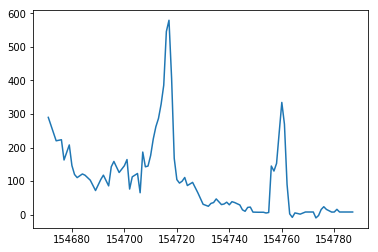

In [17]:
plt.plot(data.loc[(data.Store==16)&(data.Dept==59)].y)

In [15]:
mae[16]

{1: 0.5395576826946207,
 2: 7.4045479062318424,
 3: 12.99687641806307,
 4: 5.234253997092831,
 5: 2.458217926853732,
 6: 1.2830053641436545,
 7: 5.182252072478245,
 8: 2.4727484780268525,
 9: 0.13040457999319968,
 10: 0.6920899152560105,
 11: 0.4152264060235766,
 12: 1.823599032065624,
 13: 5.237320584085955,
 14: 4.273833984821081,
 16: 5.374713557776429,
 17: 0.8054425380975292,
 18: 1.2549860510111412,
 19: 0.7623548784784533,
 20: 5.992074162264129,
 21: 4.773970131944801,
 22: 4.549042419086005,
 23: 0.15177914175747248,
 24: 0.5823503149872802,
 25: 0.11895507764945233,
 26: 0.5535566995185724,
 27: 2.3267665698917637,
 28: 0.8763169235777936,
 29: 5.479023041484502,
 30: 15.092515544706165,
 31: 0.855074768381132,
 32: 3.0100362385146155,
 33: 0.6043587478582716,
 34: 0.20846633748869153,
 35: 5.25171030998622,
 36: 0.0019640078556165414,
 38: 1.5978670917686761,
 40: 7.835680625442061,
 41: 20.42670561512726,
 42: 3.342329462365883,
 44: 0.43900369013444285,
 45: 0.163074923536

In [14]:
list(mae[16].values())

[0.5395576826946207,
 7.4045479062318424,
 12.99687641806307,
 5.234253997092831,
 2.458217926853732,
 1.2830053641436545,
 5.182252072478245,
 2.4727484780268525,
 0.13040457999319968,
 0.6920899152560105,
 0.4152264060235766,
 1.823599032065624,
 5.237320584085955,
 4.273833984821081,
 5.374713557776429,
 0.8054425380975292,
 1.2549860510111412,
 0.7623548784784533,
 5.992074162264129,
 4.773970131944801,
 4.549042419086005,
 0.15177914175747248,
 0.5823503149872802,
 0.11895507764945233,
 0.5535566995185724,
 2.3267665698917637,
 0.8763169235777936,
 5.479023041484502,
 15.092515544706165,
 0.855074768381132,
 3.0100362385146155,
 0.6043587478582716,
 0.20846633748869153,
 5.25171030998622,
 0.0019640078556165414,
 1.5978670917686761,
 7.835680625442061,
 20.42670561512726,
 3.342329462365883,
 0.43900369013444285,
 0.16307492353615405,
 26.263004380737254,
 1.9527962764616935,
 1.6212808590124148,
 0.20894192155920824,
 1013.2363090519847,
 0.6364683384803986,
 5.193645092542738,
 

In [68]:
[(i,v) for i, v in count_qualified_rate.items() if v>0.5]

[(2, 0.6052631578947368), (14, 0.5135135135135135), (23, 0.5733333333333334)]

10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238
10238


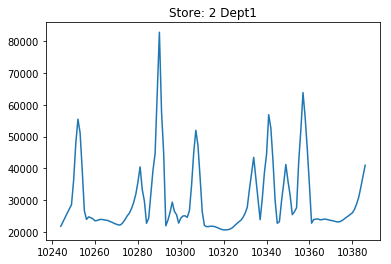

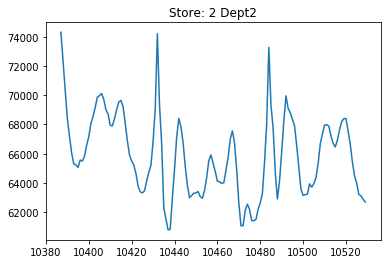

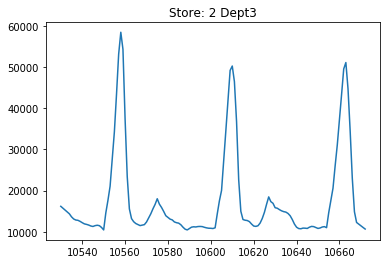

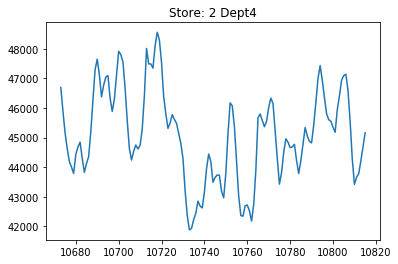

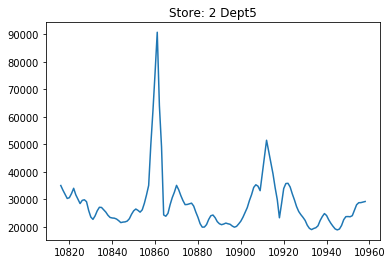

...

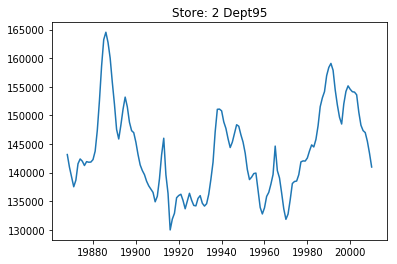

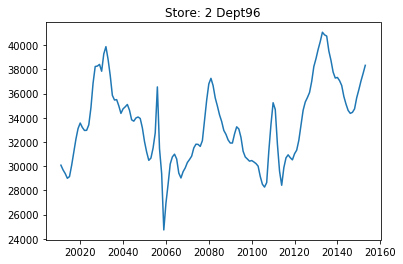

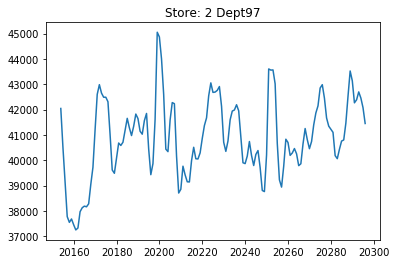

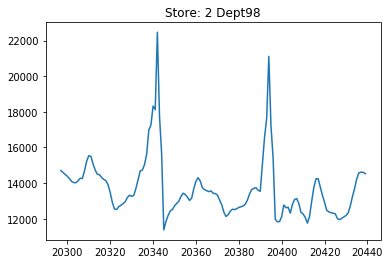

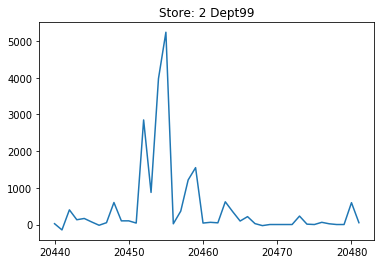

In [7]:
d = data.loc[data.Store==2]
c= 0
for dept in d.Dept.unique():
    plt.figure(c)
    plt.plot(d.loc[d.Dept==dept].y)
    print(len(d))
    plt.title('Store: 2' + ' Dept' + str(dept))
    c+=1

In [8]:
data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,CPI,Unemployment,Type,Size,y,promotion,Month,Year,day,dayofweek
0,1,1,2010-02-05,24924.50,0,42.31,2.572,0.0,0.0,0.0,...,211.096358,8.106,A,151315,24611.103103,0,2,2010,5,4
1,1,1,2010-02-12,46039.49,1,38.51,2.548,0.0,0.0,0.0,...,211.242170,8.106,A,151315,23372.055376,0,2,2010,12,4
2,1,1,2010-02-19,41595.55,0,39.93,2.514,0.0,0.0,0.0,...,211.289143,8.106,A,151315,22198.986226,0,2,2010,19,4
3,1,1,2010-02-26,19403.54,0,46.63,2.561,0.0,0.0,0.0,...,211.319643,8.106,A,151315,19748.284020,0,2,2010,26,4
4,1,1,2010-03-05,21827.90,0,46.50,2.625,0.0,0.0,0.0,...,211.350143,8.106,A,151315,20719.299400,0,3,2010,5,4


In [40]:
data

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,CPI,Unemployment,Type,Size,y,promotion,Month,Year,day,dayofweek
0,1,1,2010-02-05,24924.50,0,42.31,2.572,0.00,0.00,0.00,...,211.096358,8.106,A,151315,24611.103103,0,2,2010,5,4
1,1,1,2010-02-12,46039.49,1,38.51,2.548,0.00,0.00,0.00,...,211.242170,8.106,A,151315,23372.055376,0,2,2010,12,4
2,1,1,2010-02-19,41595.55,0,39.93,2.514,0.00,0.00,0.00,...,211.289143,8.106,A,151315,22198.986226,0,2,2010,19,4
3,1,1,2010-02-26,19403.54,0,46.63,2.561,0.00,0.00,0.00,...,211.319643,8.106,A,151315,19748.284020,0,2,2010,26,4
4,1,1,2010-03-05,21827.90,0,46.50,2.625,0.00,0.00,0.00,...,211.350143,8.106,A,151315,20719.299400,0,3,2010,5,4
5,1,1,2010-03-12,21043.39,0,57.79,2.667,0.00,0.00,0.00,...,211.380643,8.106,A,151315,21460.387984,0,3,2010,12,4
6,1,1,2010-03-19,22136.64,0,54.58,2.720,0.00,0.00,0.00,...,211.215635,8.106,A,151315,31277.471296,0,3,2010,19,4
7,1,1,2010-03-26,26229.21,0,51.45,2.732,0.00,0.00,0.00,...,211.018042,8.106,A,151315,38852.500744,0,3,2010,26,4
8,1,1,2010-04-02,57258.43,0,62.27,2.719,0.00,0.00,0.00,...,210.820450,7.808,A,151315,47354.150399,0,4,2010,2,4
9,1,1,2010-04-09,42960.91,0,65.86,2.770,0.00,0.00,0.00,...,210.622857,7.808,A,151315,42960.910000,0,4,2010,9,4


In [41]:
from sklearn.preprocessing import StandardScaler

In [44]:
sample_y = data.loc[(data.Store==1)&(data.Dept==1)].y.values.reshape(-1,1)
scaler = StandardScaler()
sample_y_scale = scaler.fit_transform(sample_y)

In [49]:
sample = data.loc[(data.Store==1)&(data.Dept==1)].y.values
sample_scale = [(i-np.mean(sample))/np.std(sample) for i in sample]

In [50]:
sample_scale


[0.4850471414685437,
 0.2957007887222824,
 0.11643702012310207,
 -0.25806955804042153,
 -0.10968284405863608,
 0.0035673700883958707,
 1.5037750533735692,
 2.661360969543793,
 3.960549305619013,
 3.28919175548363,
 2.053807340341909,
 0.7880276487141846,
 -0.7516207477570835,
 -0.6878203779756328,
 -0.7637368748512349,
 -0.7989311942363703,
 -0.8295879040287207,
 -0.7768658517253165,
 -0.7417578579981602,
 -0.756765298727836,
 -0.7606676649652166,
 -0.7182036177914859,
 -0.705480885155343,
 -0.744189811900539,
 -0.7993966862859327,
 -0.8318633940313841,
 -0.845593808396542,
 -0.8334886244605065,
 -0.8506693050825278,
 -0.8135423807821707,
 -0.6939417956894719,
 -0.5565215878015507,
 -0.4369700341561005,
 -0.27969342327587204,
 -0.07057498269214264,
 0.2086789652059819,
 0.4826710656862933,
 0.6660157040273185,
 0.3174759262602591,
 0.056544204603799976,
 -0.2884637523420345,
 -0.2879365370436685,
 0.3999308958648378,
 1.117289204261108,
 1.5374218884849216,
 3.587481002337331,
 1.65467

In [46]:
sample_y_scale.reshape(len(sample_y))

array([ 4.85047141e-01,  2.95700789e-01,  1.16437020e-01, -2.58069558e-01,
       -1.09682844e-01,  3.56737009e-03,  1.50377505e+00,  2.66136097e+00,
        3.96054931e+00,  3.28919176e+00,  2.05380734e+00,  7.88027649e-01,
       -7.51620748e-01, -6.87820378e-01, -7.63736875e-01, -7.98931194e-01,
       -8.29587904e-01, -7.76865852e-01, -7.41757858e-01, -7.56765299e-01,
       -7.60667665e-01, -7.18203618e-01, -7.05480885e-01, -7.44189812e-01,
       -7.99396686e-01, -8.31863394e-01, -8.45593808e-01, -8.33488624e-01,
       -8.50669305e-01, -8.13542381e-01, -6.93941796e-01, -5.56521588e-01,
       -4.36970034e-01, -2.79693423e-01, -7.05749827e-02,  2.08678965e-01,
        4.82671066e-01,  6.66015704e-01,  3.17475926e-01,  5.65442046e-02,
       -2.88463752e-01, -2.87936537e-01,  3.99930896e-01,  1.11728920e+00,
        1.53742189e+00,  3.58748100e+00,  1.65467487e+00,  8.57389259e-01,
       -8.08661373e-01, -6.89527962e-01, -5.32223604e-01, -3.21463062e-01,
       -5.33972373e-05, -

In [52]:
scaler.inverse_transform([0.5])

array([24708.95186023])

In [56]:
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return X,y

In [57]:
from sklearn.preprocessing import StandardScaler
# choose a number of time steps
# this time normalize data
X_train, Y_train, X_test, X_test_original, Y_test = {}, {}, {}, {}, {}
n_steps = 7
for s in [1]:
    X1, Y1, X2,  Y2 = [], [], [],[]
    for d in data.Dept.unique():
        sample = data.loc[(data.Store == s) & (data.Dept == d)]
        if len(sample) > n_steps:
            sample_y = np.array(sample.y.values)
        else:
            continue
        # sample_scale
        scaler = StandardScaler()
        sample_y_scale = scaler.fit_transform(sample_y.reshape(-1,1))
        # for each store and each dept, we have the split sample res
        # X, Y = split_sequence(sample_y, n_steps) # non scaled
        x, y = split_sequence(sample_y_scale, n_steps)
        X1 += x[:-1]
        Y1 += y[:-1]
        X2 += [x[-1]]
        Y2 += [y[-1]]
    X_train[s] = np.array(X1)
    Y_train[s] = np.array(Y1)
    X_test[s] = np.array(X2)
    # X_test_original[s] = np.array(X2_)
    Y_test[s] = np.array(Y2)

In [59]:
X_train[1].shape

(9637, 7, 1)

In [60]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense

Using TensorFlow backend.


In [62]:
n_features = 1
n_steps = 7
res = defaultdict(dict)
mape_accuracy = defaultdict(dict)
mae_accuracy = defaultdict(dict)
# train LSTM for each data/store
for s in [1]:
    x_train, y_train, x_test,  y_test = X_train[s], Y_train[s], X_test[s],  Y_test[s]
    N = len(x_train)
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    x_train_r = x_train.reshape(N, n_steps, n_features)
    x_test_r = x_test.reshape(len(x_test), n_steps, n_features)
    model.fit(x_train_r, y_train, epochs=20, verbose=0)
    yhat = model.predict(x_test_r, verbose=0) # prediction for each dept

    yhat = yhat.reshape(len(yhat),)

    depts = data.loc[(data.Store==s)]
    c = 0
    for d in depts.Dept.unique():
        if len(depts.loc[depts.Dept == d]) > n_steps:
            # inverse standard normalization
            # scaler = StandardScaler()
            # scaler.fit(depts.loc[depts.Dept == d].y.values)
            # yhat_real = scaler.inverse_transform(yhat[c])[0]
            mape_res = mape(yhat[c], y_test[c])
            naive = x_test[c][-1]
            mae = mae_scale(y_test[c], yhat[c], naive)
            mape_accuracy[s][d] = mape_res
            mae_accuracy[s][d] = mae
            res[s][d] = yhat[c]
            print('Store: '+ str(s) + ' Dept: ' + str(d) + ' mape: '+ str(mape_res) + ' mae_scaled_error: '+ str(mae))
            c+=1

W0710 15:06:39.346586 140734836262336 deprecation_wrapper.py:119] From /Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0710 15:06:39.362257 140734836262336 deprecation_wrapper.py:119] From /Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0710 15:06:39.365461 140734836262336 deprecation_wrapper.py:119] From /Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0710 15:06:39.518965 140734836262336 deprecation_wrapper.py:119] From /Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/optimizers.p

NameError: name 'mape' is not defined

In [71]:
def mae_scale(y, yhat, naive):
    return np.abs(y - yhat) / np.abs(y - naive)


def mape(pred, actual):
    #     return np.mean(abs((actual - pred) / actual))
    return np.sum(abs(actual - pred)) / np.sum(abs(actual))


In [126]:
c=0

mae = np.load('./np/norm/uni_lstm_mae_norm.npy').item()

In [128]:
mae_rate = {}
for store in mae.keys():
    mae_one = 0
    d = mae[store].values()
    for a in d:
        if a < 1:
            mae_one+=1
    mae_rate[store] = mae_one/len(d)

In [130]:
sorted(mae_rate.items(), key=lambda x: -x[1])

[(18, 0.8378378378378378),
 (19, 0.8333333333333334),
 (21, 0.8309859154929577),
 (31, 0.8243243243243243),
 (41, 0.8108108108108109),
 (38, 0.8032786885245902),
 (8, 0.7945205479452054),
 (1, 0.7866666666666666),
 (44, 0.7796610169491526),
 (34, 0.7763157894736842),
 (29, 0.7571428571428571),
 (23, 0.7466666666666667),
 (16, 0.7397260273972602),
 (39, 0.7397260273972602),
 (35, 0.7323943661971831),
 (27, 0.7272727272727273),
 (3, 0.7246376811594203),
 (30, 0.7213114754098361),
 (45, 0.7123287671232876),
 (37, 0.711864406779661),
 (32, 0.7105263157894737),
 (24, 0.7066666666666667),
 (15, 0.7027027027027027),
 (40, 0.7027027027027027),
 (25, 0.6986301369863014),
 (4, 0.6973684210526315),
 (17, 0.6944444444444444),
 (22, 0.684931506849315),
 (2, 0.6842105263157895),
 (26, 0.6756756756756757),
 (7, 0.6712328767123288),
 (14, 0.6621621621621622),
 (12, 0.6575342465753424),
 (13, 0.6493506493506493),
 (11, 0.6486486486486487),
 (9, 0.6231884057971014),
 (43, 0.6140350877192983),
 (20, 0.61

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


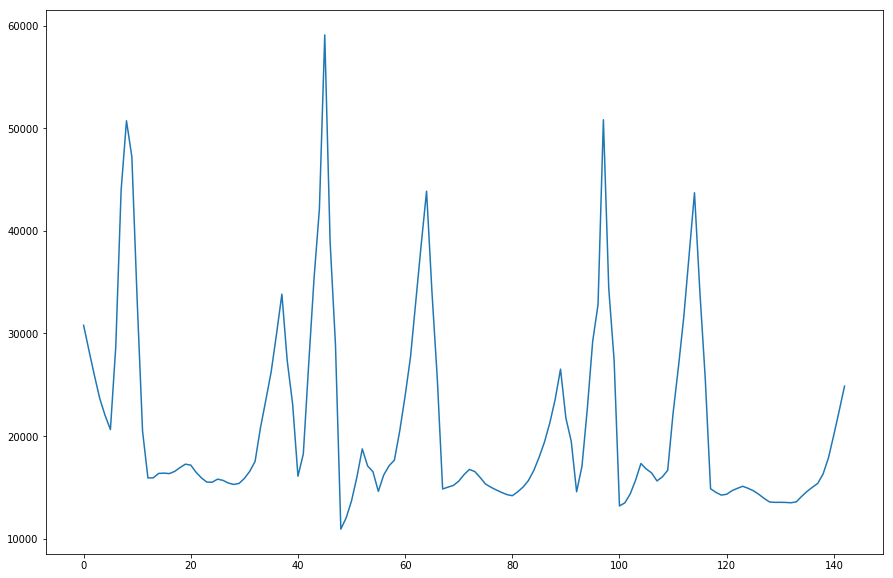

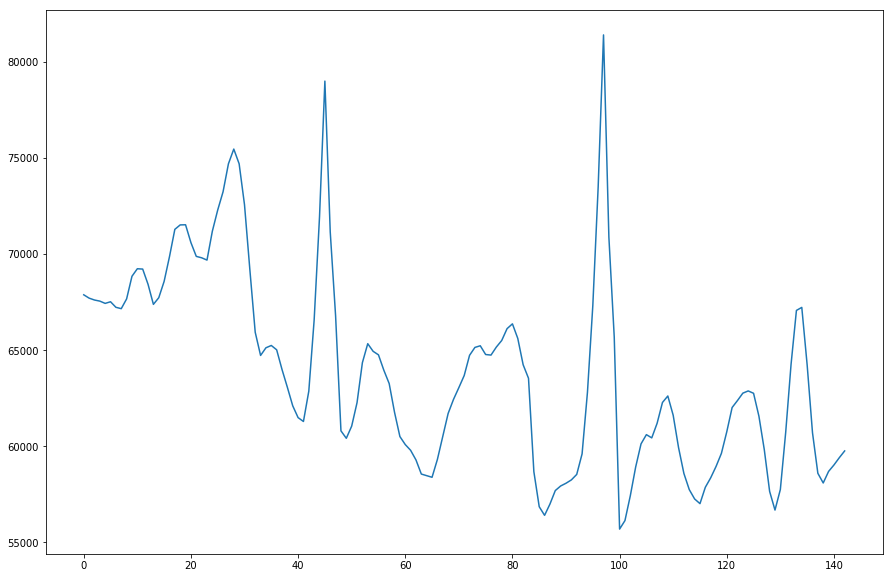

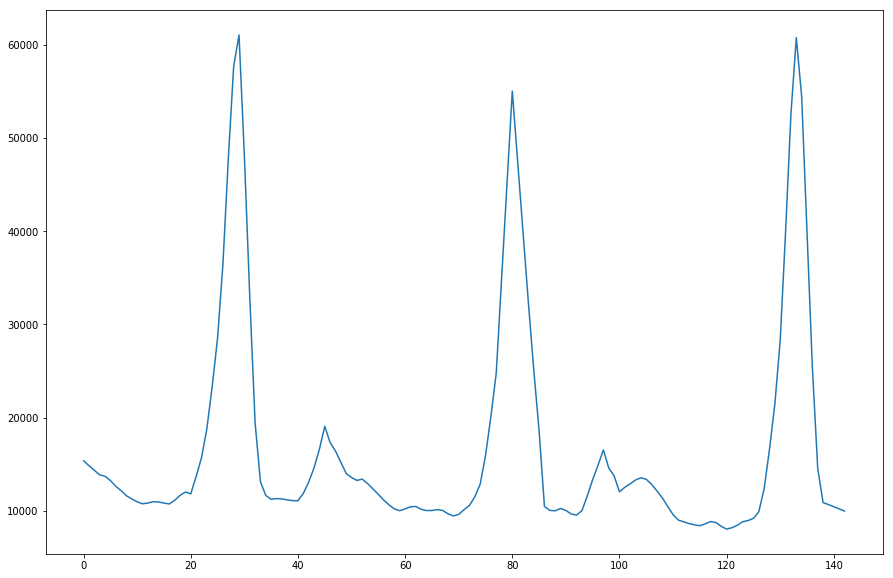

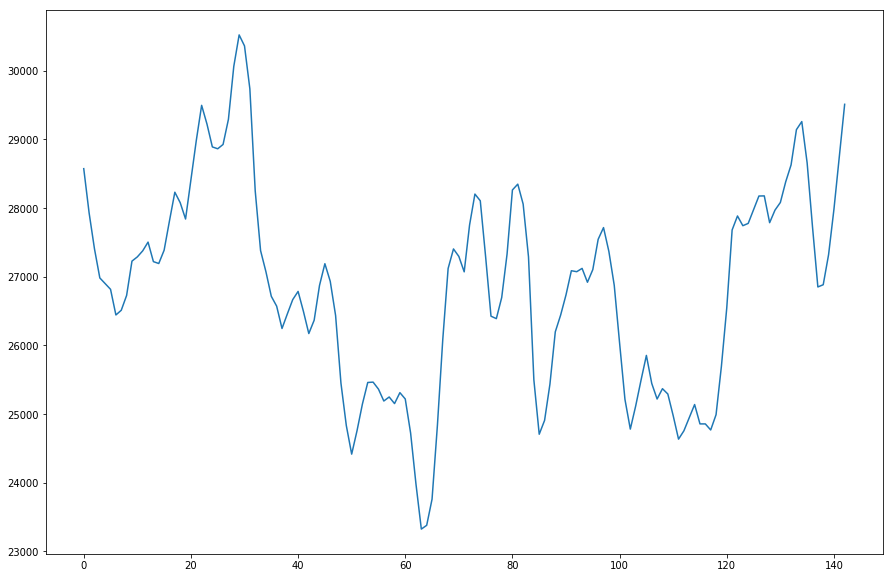

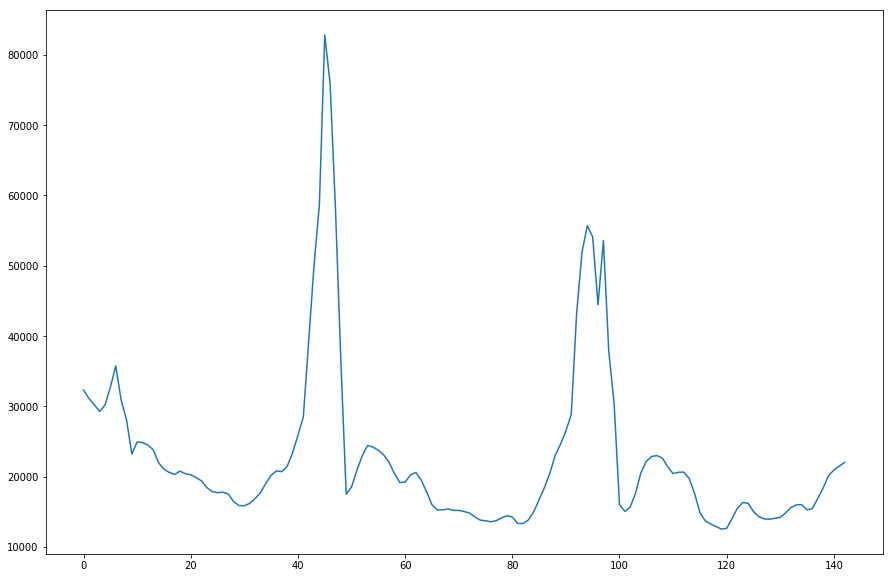

...

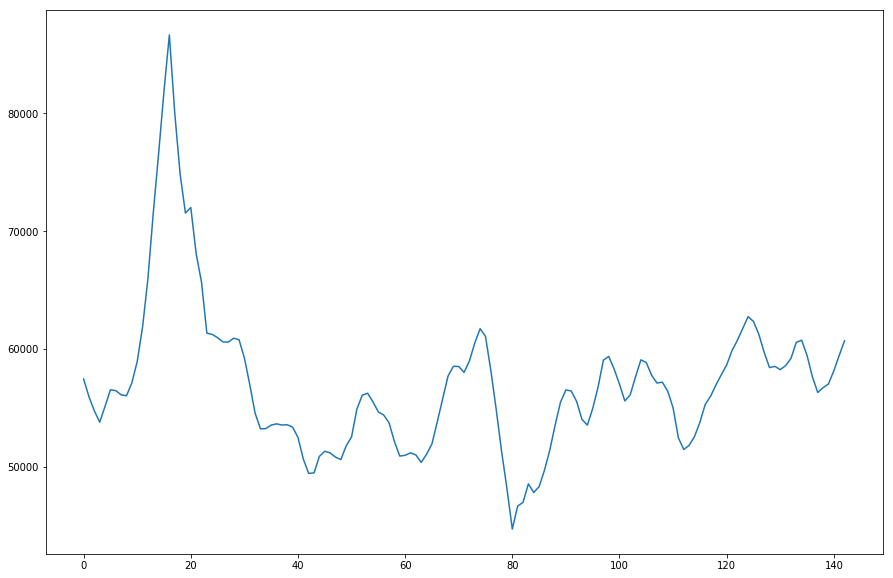

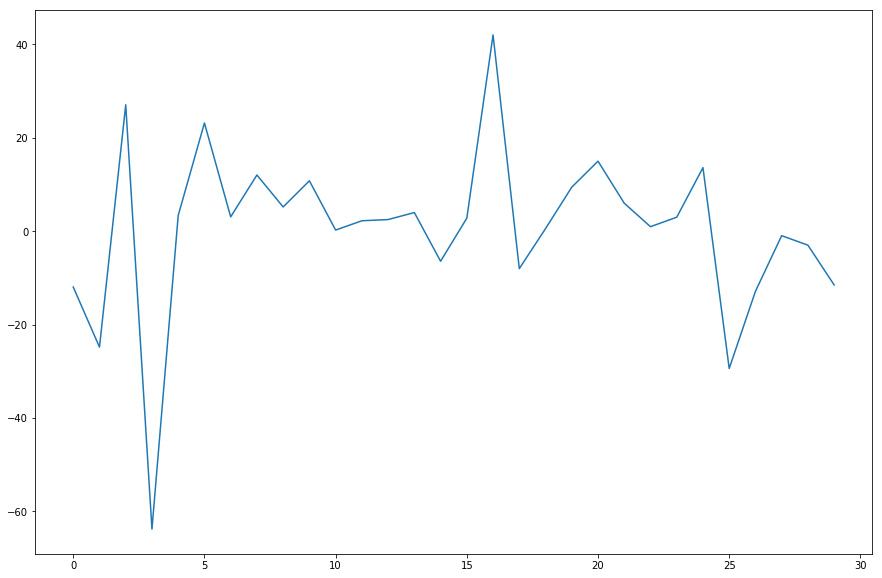

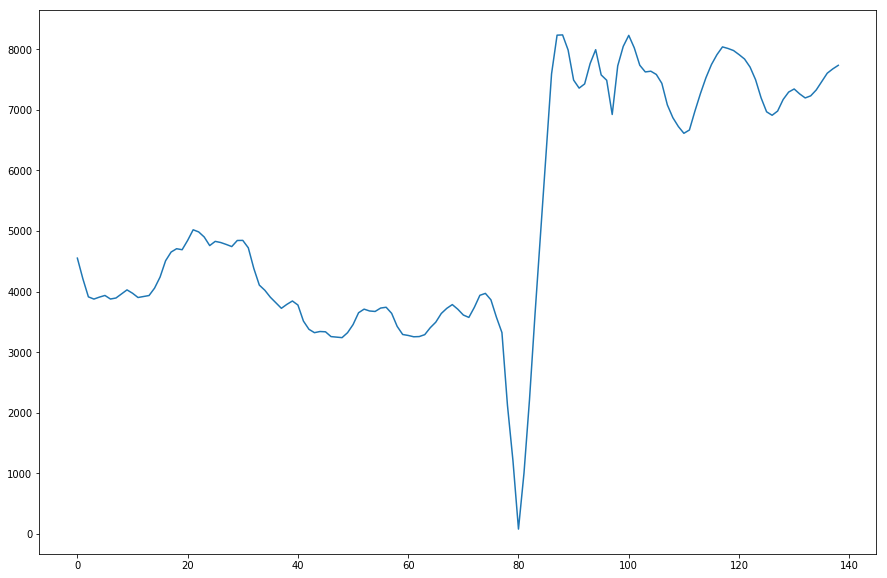

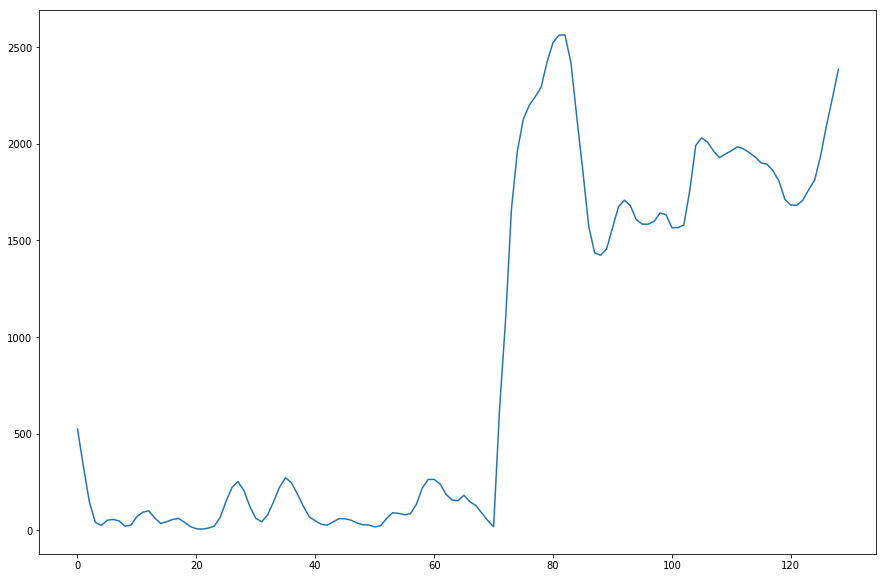

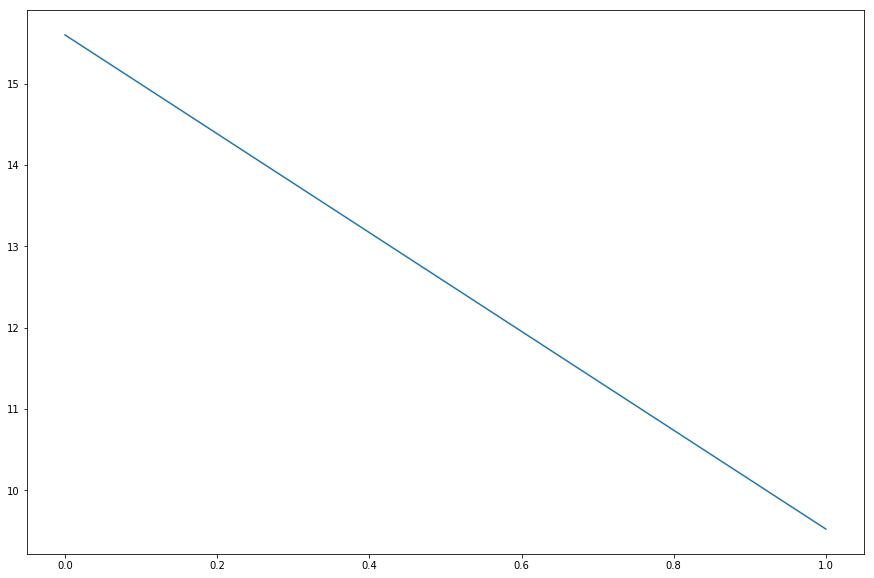

In [139]:
dd = data.loc[data.Store==18]
for d in dd.Dept.unique():
    plt.figure(figsize=(15,10))
    plt.plot(dd.loc[dd.Dept==d].y.values)

In [140]:
mape = np.load('./np/norm/uni_lstm_mape_norm.npy').item()

In [142]:
mape_rate = {}
for store in mape.keys():
    mape_one = 0
    d = mape[store].values()
    for a in d:
        if a <= 0.3:
            mape_one+=1
    mape_rate[store] = mae_one/len(d)

In [144]:
sorted(mape_rate.items(), key=lambda x: -x[1])

[(36, 0.9629629629629629),
 (33, 0.9454545454545454),
 (42, 0.9454545454545454),
 (43, 0.9122807017543859),
 (37, 0.8813559322033898),
 (44, 0.8813559322033898),
 (30, 0.8524590163934426),
 (38, 0.8524590163934426),
 (5, 0.7647058823529411),
 (3, 0.7536231884057971),
 (9, 0.7536231884057971),
 (29, 0.7428571428571429),
 (21, 0.7323943661971831),
 (35, 0.7323943661971831),
 (17, 0.7222222222222222),
 (7, 0.7123287671232876),
 (8, 0.7123287671232876),
 (12, 0.7123287671232876),
 (16, 0.7123287671232876),
 (22, 0.7123287671232876),
 (25, 0.7123287671232876),
 (39, 0.7123287671232876),
 (45, 0.7123287671232876),
 (11, 0.7027027027027027),
 (14, 0.7027027027027027),
 (15, 0.7027027027027027),
 (18, 0.7027027027027027),
 (26, 0.7027027027027027),
 (31, 0.7027027027027027),
 (40, 0.7027027027027027),
 (41, 0.7027027027027027),
 (1, 0.6933333333333334),
 (23, 0.6933333333333334),
 (24, 0.6933333333333334),
 (28, 0.6933333333333334),
 (2, 0.6842105263157895),
 (4, 0.6842105263157895),
 (6, 0.68